# Using Low-Rank Kernel Matrix Approximation on OKGT -- Nystroem -- Laplace Kernel -- Evaluate the Effect of Number of Components

**Note** Laplace kernel is used throughout this document.

This notebook evaluates the effect of **number of components** of Nystroem kernel matrix approximation on OKGT. The Nystroem method is provided in `sklearn.kernel_approximation`.

We use the same model which is from [this post](http://partofthething.com/ace/samples.html). The following is the model representation:

$$
Y = \ln (4 + \sin(4X_0)) + |X_1| + X_2^2 + X_3^3 + X_4 + 0.1\epsilon
$$

where $\epsilon \sim N(0,1)$ and each covariate is simulated from $Unif(-1,1)$.

In [191]:
# Simulate data
import okgtreg.simulate as simulate
import okgtreg.kernel_selector as ks
import numpy as np
import scipy as sp
from sklearn.kernel_approximation import Nystroem

np.random.seed(10)
n = 500 # sample size
y, x = simulate.SimData_Wang04(n)
y = np.matrix(y)
x = np.matrix(x)

In [193]:
# Specify the constants, regularization coefficient and kernel functions
eps = 0. # regularization term

p = x.shape[1]
xGroup = [[i+1] for i in range(p)]
# kfn = ks.KernelSelector('Gaussian', sigma=0.5) # Gaussian kernel
kfn = ks.KernelSelector('Laplace', alpha=0.5) # Laplace kernel
# xkfnlist = [kfn]*p
# ykfnlist = [kfn]

**Number of components** of Nystroem method is the only variable changing throughout the study.

In [196]:
# Define the simulation function

# x, y, n, p, kfn are given globally

def SimulateStudyLaplace_Nystroem_NumberOfComponents(nComp):
    nystroem = Nystroem(kfn, n_components=nComp) 

    def ApplyNystroemOnKernelMatrix(x, nystroem):
        return np.matrix(nystroem.fit_transform(x))
    
    Gy = ApplyNystroemOnKernelMatrix(y, nystroem)
    N0 = np.identity(n) - np.ones((n,n))/n
    Uy, Gy_s, Gy_V = np.linalg.svd(N0 * Gy, full_matrices=0)
    lambday = Gy_s**2
    
    Ux = []
    lambdax = []
    for i in range(p):
        Gi = ApplyNystroemOnKernelMatrix(x[:,i], nystroem)
        Ui, Gi_s, Gi_V = np.linalg.svd(N0 * Gi, full_matrices=0)
        Ux.append(Ui)
        lambdai = Gi_s**2
        lambdax.append(lambdai)
    
    lambdax_row = np.hstack(lambdax)
    Ux_row = np.hstack(Ux)
    Ux_diag = sp.sparse.block_diag(Ux)

    T = np.diag(lambday / (lambday + eps)) * Uy.T * Ux_row * np.diag(lambdax_row)
    R = np.diag((lambdax_row + eps)**2) + \
            np.diag(lambdax_row) * (Ux_row.T * Ux_row - np.identity(len(lambdax_row))) * np.diag(lambdax_row)

    R_inv = np.linalg.inv(R)
    
    vv = T*R_inv*T.T
    
    my = vv.shape[0]
    eigval, eigvec = sp.linalg.eigh(vv, eigvals=(my-1, my-1))
    
    g_opt = np.diag(lambday) * np.matrix(eigvec)
    g_opt = Uy * g_opt
    
    f_opt = np.diag(np.sqrt(lambday**2 + eps) * lambday) * np.matrix(eigvec)
    f_opt = T.T * f_opt
    f_opt = R_inv * f_opt
    f_opt = np.diag(lambdax_row) * f_opt
    f_opt = Ux_diag * f_opt

    f_opt = f_opt.reshape((n, p), order='F')
    
    return float(eigval), g_opt, f_opt

In [197]:
# Run simulation
import time

r2_list = []
g_list = []
f_list = []
time_list = []

for i in range(n):    
    start = time.time()
    r2, g, f = SimulateStudyLaplace_Nystroem_NumberOfComponents(i+1)
    end = time.time()
    duration = end - start
    
    r2_list.append(r2)
    g_list.append(g)
    f_list.append(f)
    time_list.append(duration)
    
    print i+1, ':', duration

1 : 0.0599460601807
2 : 0.0981361865997
3 : 0.160106897354
4 : 0.192497014999
5 : 0.246431112289
6 : 0.285377979279
7 : 0.333267211914
8 : 0.367990970612
9 : 0.404580116272
10 : 0.447834014893
11 : 0.513031959534
12 : 0.539305925369
13 : 0.585448980331
14 : 0.627152919769
15 : 0.68332695961
16 : 0.729388952255
17 : 0.76789188385
18 : 0.852770090103
19 : 0.877789974213
20 : 0.890179157257
21 : 0.960196018219
22 : 1.0357401371
23 : 1.03398299217
24 : 1.16693997383
25 : 1.14724183083
26 : 1.23671388626
27 : 1.35009908676
28 : 1.29931807518
29 : 1.35591197014
30 : 1.42032194138
31 : 1.55247497559
32 : 1.5015630722
33 : 1.51084494591
34 : 1.53532099724
35 : 1.63733506203
36 : 1.67258000374
37 : 1.69211697578
38 : 1.74751782417
39 : 1.83957099915
40 : 1.83925700188
41 : 1.85885906219
42 : 1.96486520767
43 : 1.93694710732
44 : 2.15397381783
45 : 2.08287501335
46 : 2.14718103409
47 : 2.39983415604
48 : 2.20552110672
49 : 2.30368208885
50 : 2.31435489655
51 : 2.40136289597
52 : 2.55670690536
53

Plot the time along the **number of components**.

In [198]:
%matplotlib inline
import matplotlib.pyplot as plt

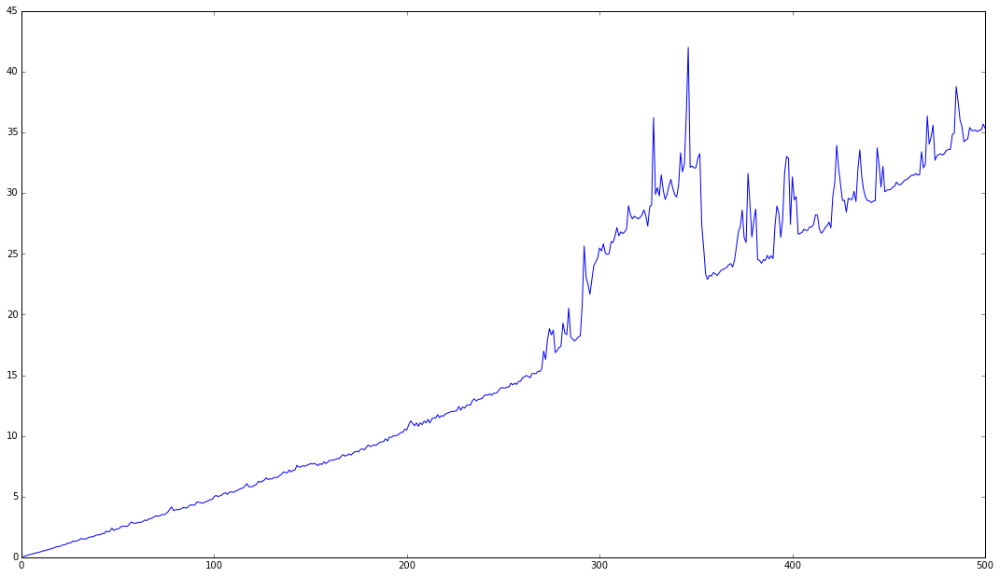

In [251]:
# Time ~ number of components
fig = plt.figure()
fig.set_size_inches(18.5, 10.5)
plt.plot(np.arange(n)+1, time_list)

Number of components for stable cases:
[ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25
 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50
 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 73 74 75
 76 77 78 80 81 82 83]


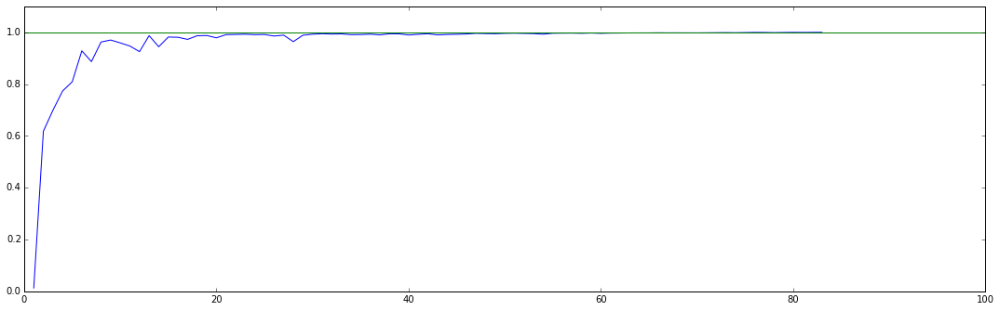

In [281]:
# Plot r2
r2_arr = np.array(r2_list)
# np.max(r2_arr)
r2ind_LessThanOne = np.where(r2_arr < 1)[0]

print 'Number of components for stable cases:\n', r2ind_LessThanOne + 1

fig = plt.figure()
fig.set_size_inches(18.5, 5.5)
plt.plot(r2ind_LessThanOne+1, r2_arr[r2ind_LessThanOne])
plt.axis([0, 100, 0, 1.1])
plt.plot([0,100], [1,1]) # reference line

In this simulation, it shows that when the **number of components** $> 83$ $R^2$ blows up. <font color='red'>This is an indication of numerical instability.</font> (With 79 components, $R^2 = 3.9592$).

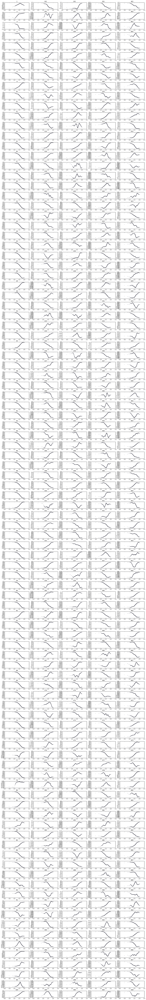

In [287]:
# Plot g
# nPlots = 50

subplot_width = 3.5 # inch
subplot_height = 1.2

nrow = 100
ncol = 5
fig, axarr = plt.subplots(nrow, ncol)
fig.set_size_inches(ncol*subplot_width, nrow*subplot_height)
fig.tight_layout()

for j in range(ncol):
    for i in range(nrow):
        axarr[i,j].scatter(y, g_list[j*nrow + i], s=0.5)
        axarr[i,j].set_title(j*nrow + i + 1)

Transformation becomes unstable after using more than 75 components.

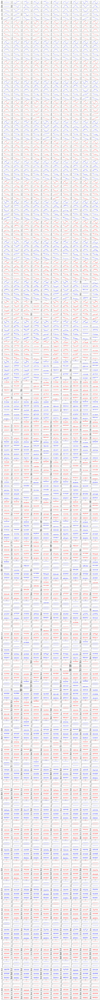

In [286]:
# Plot f

# nTrials = 2
# nPlots = nTrials * 4

subplot_width = 3
subplot_height = 1.2

nrow = 5 # 5 X variables
ncol = 10
nrowblocks = 50 # ncol*nrowblocks cases

fig, axarr = plt.subplots(nrow*nrowblocks, ncol)
fig.set_size_inches(subplot_width*ncol, subplot_height*nrow*nrowblocks)
fig.tight_layout()

for k in range(nrowblocks):
    if k%2 == 1:
        plot_color = 'r'
    else:
        plot_color = 'b'
    for j in range(ncol):
        axarr[k*nrow,j].set_title(k*ncol + j + 1)
        for i in range(nrow):
            axarr[k*nrow+i, j].scatter(x[:,i], f_list[k*nrow+j][:,i], s=0.5, color=plot_color)